In [1]:
import pandas as pd 
from matplotlib import pyplot as plt 

In [2]:
stock_data = pd.read_csv("stock_data.csv", index_col="Date")

In [3]:
company_list = tuple(set(stock_data["Stock"]))
print(company_list)

('AAPL', 'FB', 'TSLA', 'MSFT')


In [4]:
aapl_stock_data = stock_data[stock_data["Stock"] == "AAPL"]
fb_stock_data = stock_data[stock_data["Stock"] == "FB"]
msft_stock_data = stock_data[stock_data["Stock"] == "MSFT"]
tsla_stock_data = stock_data[stock_data["Stock"] == "TSLA"]

In [5]:
company_stock_data = dict(zip(('TSLA', 'AAPL', 'MSFT', 'FB'), (tsla_stock_data, aapl_stock_data, msft_stock_data, fb_stock_data)))

In [7]:
company_stock_data["AAPL"].tail(10)

,Open,High,Low,Close,Volume,OpenInt,Stock
Date,,,,,,,
1984-09-07,0.42388,0.42902,0.41874,0.42388,23220030,0,AAPL
1984-09-10,0.42388,0.42516,0.41366,0.42134,18022532,0,AAPL
1984-09-11,0.42516,0.43668,0.42516,0.42902,42498199,0,AAPL
1984-09-12,0.42902,0.43157,0.41618,0.41618,37125801,0,AAPL
1984-09-13,0.43927,0.44052,0.43927,0.43927,57822062,0,AAPL
1984-09-14,0.44052,0.45589,0.44052,0.44566,68847968,0,AAPL
1984-09-17,0.45718,0.46357,0.45718,0.45718,53755262,0,AAPL
1984-09-18,0.45718,0.46103,0.44052,0.44052,27136886,0,AAPL
1984-09-19,0.44052,0.44566,0.43157,0.43157,29641922,0,AAPL


In [7]:
def showHistoricalPrice(df, n, cp_name):
    if n > 0:
        df = df.head(n)
    plt.figure(figsize=(30, 10))
    for i, price in enumerate(("Open", "Close", "Low", "High"), 1):
        plt.subplot(2, 2, i)
        df[price].plot()
        plt.xlabel(None)
        plt.xticks(rotation=45)
        plt.title(f"{price} price of {cp_name}")

    plt.tight_layout()
    plt.show()

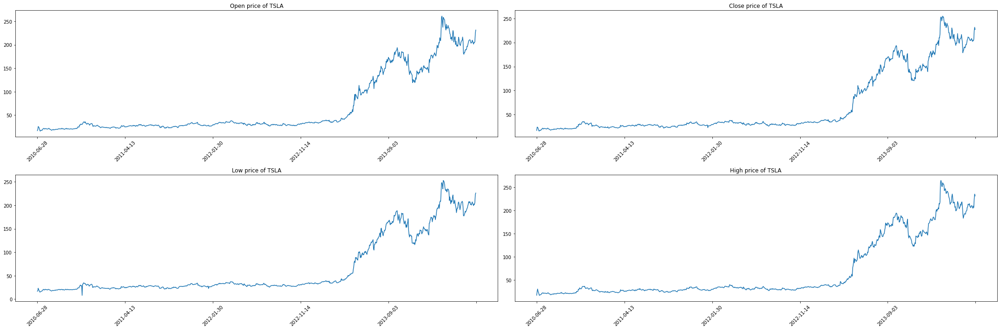

In [8]:
showHistoricalPrice(company_stock_data[company_list[2]], 1000, company_list[2])

In [9]:
def showTogetherHistoricalPrice(df, n, cp_name):
    if n > 0:
        df = df.head(n)
    fig = plt.figure(figsize=(30, 10))
    axe = fig.add_subplot()
    df[["Open", "Close", "Low", "High"]].plot(ax=axe)
    axe.set_xlabel(None)
    axe.set_title(f"Stock price of {cp_name}")

    plt.tight_layout()
    plt.show()

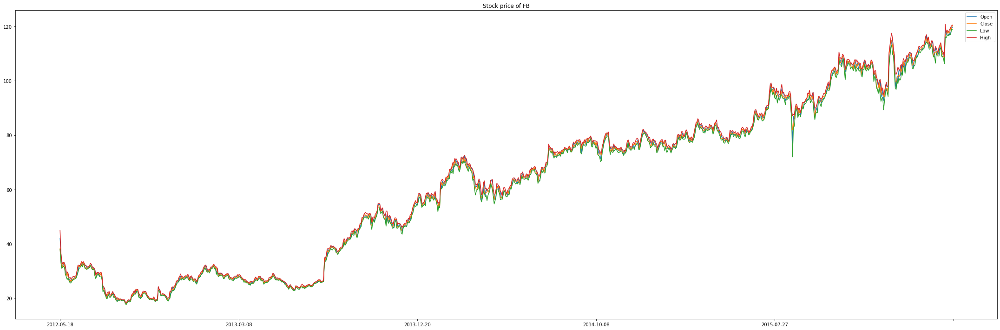

In [10]:
showTogetherHistoricalPrice(company_stock_data[company_list[3]], 1000, company_list[3])

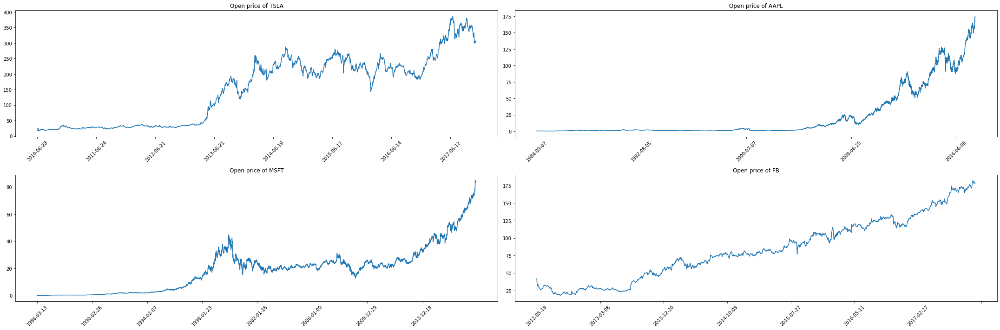

In [11]:
# Open price of 4 companies
plt.figure(figsize=(30, 10))
for i, (cmp_name, cmp) in enumerate(company_stock_data.items(), 1):
    axe = plt.subplot(2, 2, i)
    cmp["Open"].plot()
    plt.xlabel(None)
    plt.xticks(rotation=45)
    plt.title(f"Open price of {cmp_name}")

plt.tight_layout()
plt.show()

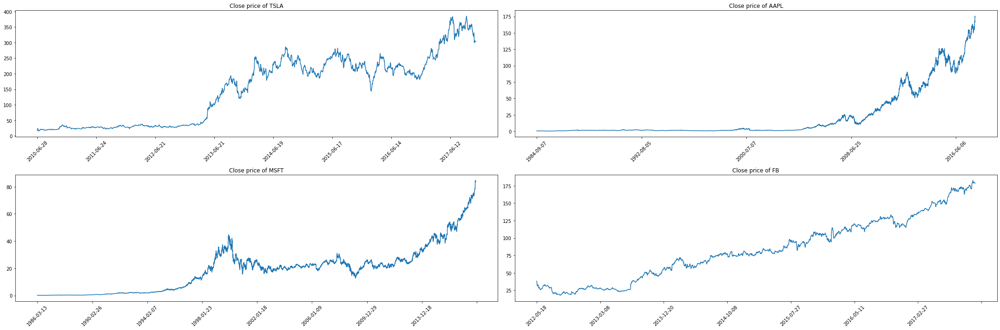

In [12]:
# Close price of 4 companies
plt.figure(figsize=(30, 10))
for i, (cmp_name, cmp) in enumerate(company_stock_data.items(), 1):
    axe = plt.subplot(2, 2, i)
    cmp["Close"].plot()
    plt.xticks(rotation=45)
    plt.xlabel(None)
    plt.title(f"Close price of {cmp_name}")

plt.tight_layout()
plt.show()

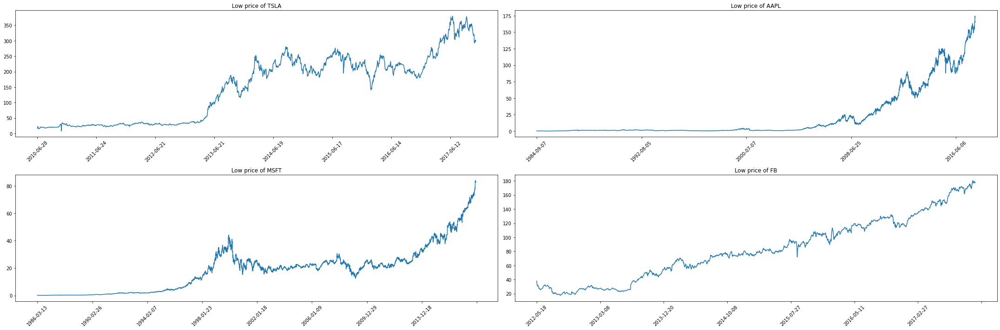

In [13]:
# Low price of 4 companies
plt.figure(figsize=(30, 10))
for i, (cmp_name, cmp) in enumerate(company_stock_data.items(), 1):
    axe = plt.subplot(2, 2, i)
    cmp["Low"].plot()
    plt.xticks(rotation=45)
    plt.xlabel(None)
    plt.title(f"Low price of {cmp_name}")

plt.tight_layout()
plt.show()

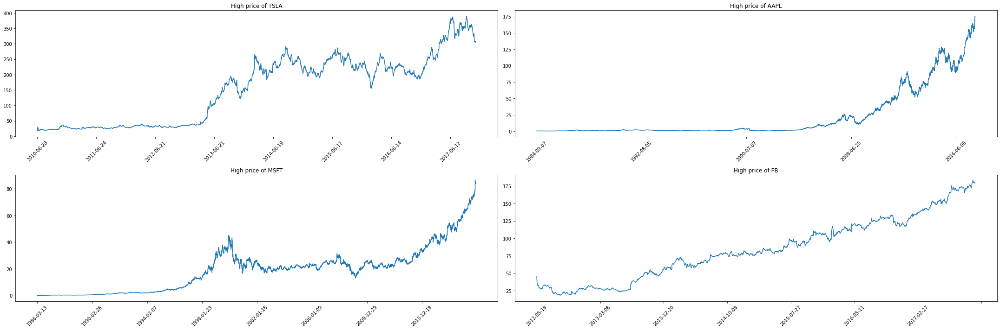

In [14]:
# High price of 4 companies
plt.figure(figsize=(30, 10))
for i, (cmp_name, cmp) in enumerate(company_stock_data.items(), 1):
    axe = plt.subplot(2, 2, i)
    cmp["High"].plot()
    plt.xticks(rotation=45)
    plt.xlabel(None)
    plt.title(f"High price of {cmp_name}")

plt.tight_layout()
plt.show()

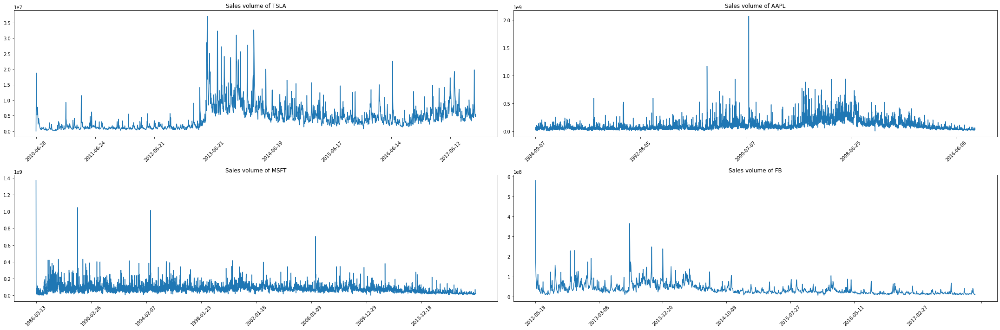

In [15]:
# Sales volume of 4 companies
plt.figure(figsize=(30, 10))
for i, (cmp_name, cmp) in enumerate(company_stock_data.items(), 1):
    axe = plt.subplot(2, 2, i)
    cmp["Volume"].plot()
    plt.xticks(rotation=45)
    plt.xlabel(None)
    plt.title(f"Sales volume of {cmp_name}")

plt.tight_layout()
plt.show()

In [16]:
ma_day = [10, 20, 50]

for ma in ma_day:
    for company in company_list:
        column_name = f"MA for {ma} days"
        company_stock_data[company][column_name] = company_stock_data[company]['Close'].rolling(ma).mean()

<ipython-input-16-815aa5ec1a54>:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  company_stock_data[company][column_name] = company_stock_data[company]['Close'].rolling(ma).mean()


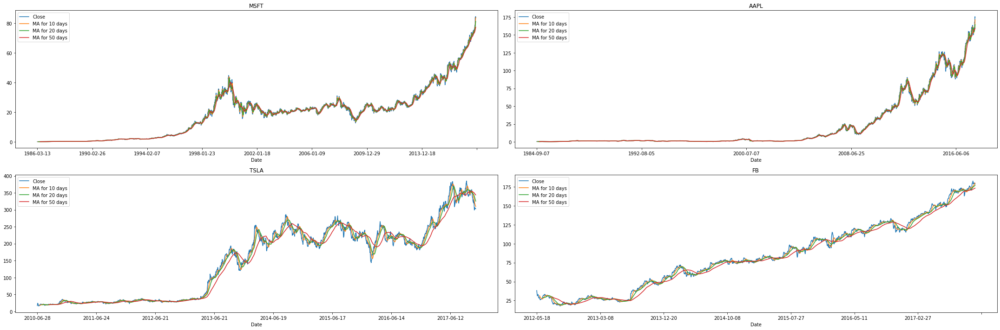

In [17]:
fig, axes = plt.subplots(nrows=2, ncols=2)
fig.set_figheight(10)
fig.set_figwidth(30)

company_stock_data[company_list[0]][['Close', 'MA for 10 days', 'MA for 20 days', 'MA for 50 days']].plot(ax=axes[0,0])
axes[0,0].set_title(company_list[0])

company_stock_data[company_list[1]][['Close', 'MA for 10 days', 'MA for 20 days', 'MA for 50 days']].plot(ax=axes[0,1])
axes[0,1].set_title(company_list[1])

company_stock_data[company_list[2]][['Close', 'MA for 10 days', 'MA for 20 days', 'MA for 50 days']].plot(ax=axes[1,0])
axes[1,0].set_title(company_list[2])

company_stock_data[company_list[3]][['Close', 'MA for 10 days', 'MA for 20 days', 'MA for 50 days']].plot(ax=axes[1,1])
axes[1,1].set_title(company_list[3])

fig.tight_layout()

In [18]:
for company_name in company_stock_data.keys():
    company_stock_data[company_name]['Daily Return'] = company_stock_data[company_name]['Close'].pct_change()

<ipython-input-18-68097a940def>:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  company_stock_data[company_name]['Daily Return'] = company_stock_data[company_name]['Close'].pct_change()


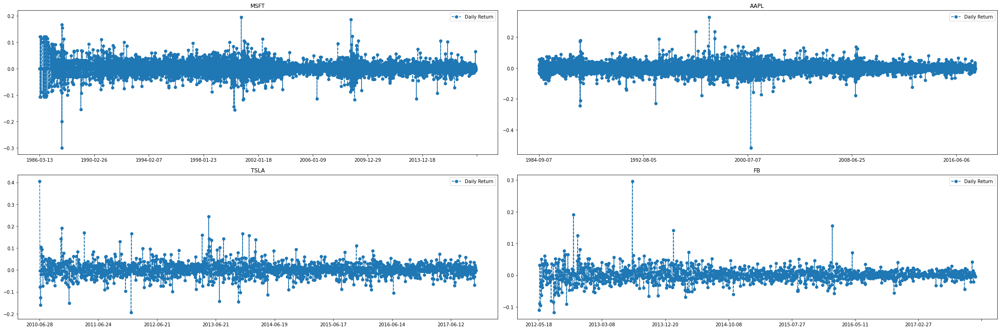

In [19]:
fig, axes = plt.subplots(nrows=2, ncols=2)
fig.set_figheight(10)
fig.set_figwidth(30)

company_stock_data[company_list[0]]['Daily Return'].plot(ax=axes[0,0], legend=True, linestyle='--', marker='o')
axes[0, 0].set_title(company_list[0])
axes[0, 0].set_xlabel(None)

company_stock_data[company_list[1]]['Daily Return'].plot(ax=axes[0,1], legend=True, linestyle='--', marker='o')
axes[0, 1].set_title(company_list[1])
axes[0, 1].set_xlabel(None)

company_stock_data[company_list[2]]['Daily Return'].plot(ax=axes[1,0], legend=True, linestyle='--', marker='o')
axes[1, 0].set_title(company_list[2])
axes[1, 0].set_xlabel(None)

company_stock_data[company_list[3]]['Daily Return'].plot(ax=axes[1,1], legend=True, linestyle='--', marker='o')
axes[1, 1].set_title(company_list[3])
axes[1, 1].set_xlabel(None)

fig.tight_layout()

In [20]:
import seaborn as sns
from pandas_datareader import DataReader

In [21]:
'''
tmp_dates = [company_stock_data[company_name].index.to_list() for company_name in company_list]
dates = []
for date in tmp_dates:
    dates += date
'''
dates = [company_stock_data[company_name].index.to_list() for company_name in company_list]
start = max([min(date) for date in dates])
end = min([max(date) for date in dates])

In [22]:
closing_df = DataReader(company_list, "yahoo", start, end)["Close"]
closing_df.head(10)

Symbols,MSFT,AAPL,TSLA,FB
Date,,,,
2012-05-17,29.719999,18.932858,5.714,NaN
2012-05-18,29.270000,18.942142,5.512,38.230000
2012-05-21,29.750000,20.045713,5.754,34.029999
2012-05-22,29.760000,19.891787,6.160,31.000000
2012-05-23,29.110001,20.377144,6.204,32.000000
2012-05-24,29.070000,20.190001,6.056,33.029999
2012-05-25,29.059999,20.081785,5.962,31.910000
2012-05-29,29.559999,20.438213,6.338,28.840000
2012-05-30,29.340000,20.684643,6.082,28.190001


In [23]:
company_daily_returns = closing_df.pct_change()
company_daily_returns.head(10)

Symbols,MSFT,AAPL,TSLA,FB
Date,,,,
2012-05-17,NaN,NaN,NaN,NaN
2012-05-18,-0.015141,0.000490,-0.035352,NaN
2012-05-21,0.016399,0.058260,0.043904,-0.109861
2012-05-22,0.000336,-0.007679,0.070560,-0.089039
2012-05-23,-0.021841,0.024400,0.007143,0.032258
2012-05-24,-0.001374,-0.009184,-0.023856,0.032187
2012-05-25,-0.000344,-0.005360,-0.015522,-0.033909
2012-05-29,0.017206,0.017749,0.063066,-0.096208
2012-05-30,-0.007442,0.012057,-0.040391,-0.022538


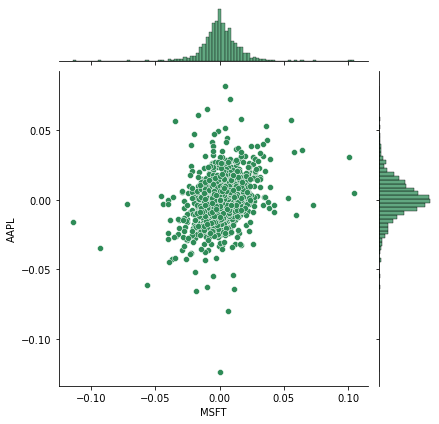

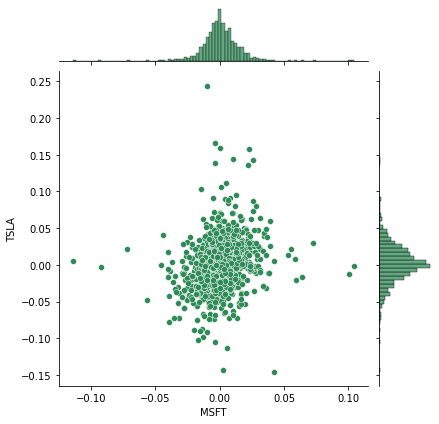

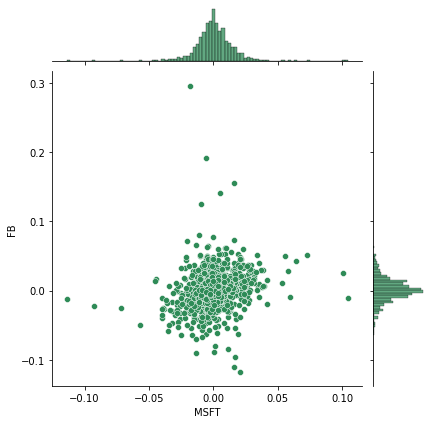

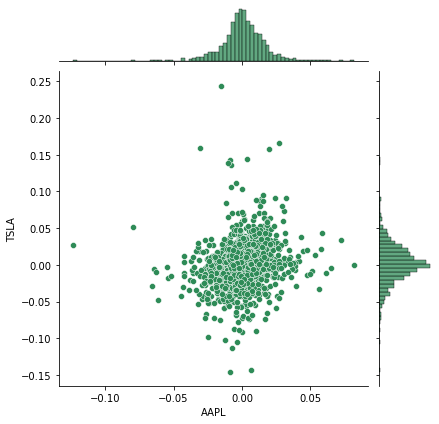

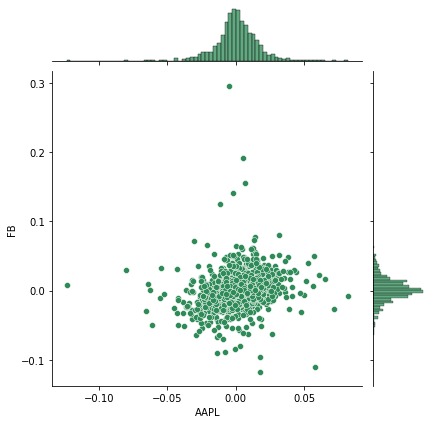

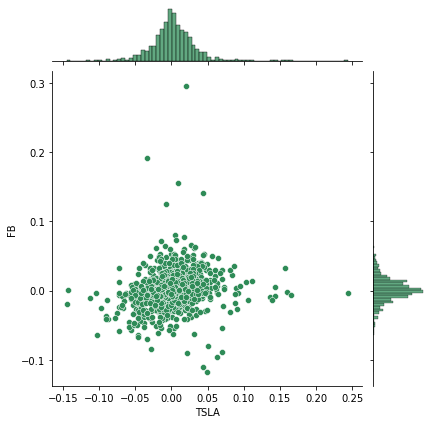

In [24]:
for x in company_list:
    for y in range(company_list.index(x)+1, len(company_list)):
        sns.jointplot(x=x, y=company_daily_returns[company_list[y]], data=company_daily_returns, kind='scatter', color='seagreen')

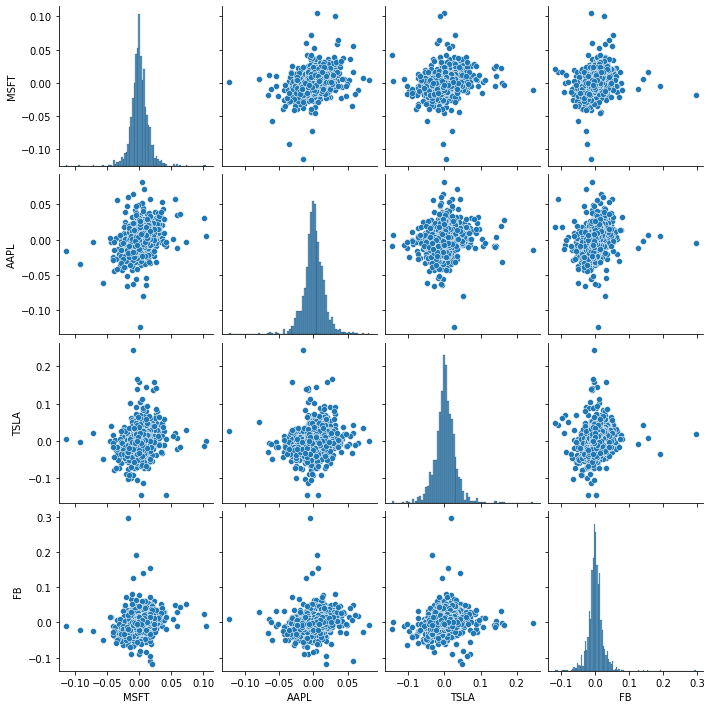

In [25]:
sns.pairplot(company_daily_returns)